In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3504.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3926.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3721.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3851.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3749.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3975.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3223.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3577.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3615.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3931.txt


In [2]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
!pip install -r requirements.txt  # install

from ultralytics import YOLO

# Load a model
model = YOLO("yolov5s.pt")

!pip uninstall -y wandb

Cloning into 'yolov5'...
remote: Enumerating objects: 17306, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 17306 (delta 15), reused 4 (delta 4), pack-reused 17286 (from 5)
Receiving objects: 100% (17306/17306), 16.16 MiB | 34.20 MiB/s, done.
Resolving deltas: 100% (11878/11878), done.
/kaggle/working/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 26.4 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://githu

100%|██████████| 17.7M/17.7M [00:00<00:00, 224MB/s]


Found existing installation: wandb 0.19.1
Uninstalling wandb-0.19.1:
  Successfully uninstalled wandb-0.19.1


In [3]:
%%writefile /kaggle/working/yolov5/utils/dataloaders.py


# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license
"""Dataloaders and dataset utils."""

import cv2
change_colorspace = cv2.COLOR_BGR2XYZ

import contextlib
import glob
import hashlib
import json
import math
import os
import random
import shutil
import time
from itertools import repeat
from multiprocessing.pool import Pool, ThreadPool
from pathlib import Path
from threading import Thread
from urllib.parse import urlparse

import numpy as np
import psutil
import torch
import torch.nn.functional as F
import torchvision
import yaml
from PIL import ExifTags, Image, ImageOps
from torch.utils.data import DataLoader, Dataset, dataloader, distributed
from tqdm import tqdm

from utils.augmentations import (
    Albumentations,
    augment_hsv,
    classify_albumentations,
    classify_transforms,
    copy_paste,
    letterbox,
    mixup,
    random_perspective,
)
from utils.general import (
    DATASETS_DIR,
    LOGGER,
    NUM_THREADS,
    TQDM_BAR_FORMAT,
    check_dataset,
    check_requirements,
    check_yaml,
    clean_str,
    cv2,
    is_colab,
    is_kaggle,
    segments2boxes,
    unzip_file,
    xyn2xy,
    xywh2xyxy,
    xywhn2xyxy,
    xyxy2xywhn,
)
from utils.torch_utils import torch_distributed_zero_first

# Parameters
HELP_URL = "See https://docs.ultralytics.com/yolov5/tutorials/train_custom_data"
IMG_FORMATS = "bmp", "dng", "jpeg", "jpg", "mpo", "png", "tif", "tiff", "webp", "pfm"  # include image suffixes
VID_FORMATS = "asf", "avi", "gif", "m4v", "mkv", "mov", "mp4", "mpeg", "mpg", "ts", "wmv"  # include video suffixes
LOCAL_RANK = int(os.getenv("LOCAL_RANK", -1))  # https://pytorch.org/docs/stable/elastic/run.html
RANK = int(os.getenv("RANK", -1))
WORLD_SIZE = int(os.getenv("WORLD_SIZE", 1))
PIN_MEMORY = str(os.getenv("PIN_MEMORY", True)).lower() == "true"  # global pin_memory for dataloaders

# Get orientation exif tag
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == "Orientation":
        break


def get_hash(paths):
    """Generates a single SHA256 hash for a list of file or directory paths by combining their sizes and paths."""
    size = sum(os.path.getsize(p) for p in paths if os.path.exists(p))  # sizes
    h = hashlib.sha256(str(size).encode())  # hash sizes
    h.update("".join(paths).encode())  # hash paths
    return h.hexdigest()  # return hash


def exif_size(img):
    """Returns corrected PIL image size (width, height) considering EXIF orientation."""
    s = img.size  # (width, height)
    with contextlib.suppress(Exception):
        rotation = dict(img._getexif().items())[orientation]
        if rotation in [6, 8]:  # rotation 270 or 90
            s = (s[1], s[0])
    return s


def exif_transpose(image):
    """
    Transpose a PIL image accordingly if it has an EXIF Orientation tag.
    Inplace version of https://github.com/python-pillow/Pillow/blob/master/src/PIL/ImageOps.py exif_transpose().

    :param image: The image to transpose.
    :return: An image.
    """
    exif = image.getexif()
    orientation = exif.get(0x0112, 1)  # default 1
    if orientation > 1:
        method = {
            2: Image.FLIP_LEFT_RIGHT,
            3: Image.ROTATE_180,
            4: Image.FLIP_TOP_BOTTOM,
            5: Image.TRANSPOSE,
            6: Image.ROTATE_270,
            7: Image.TRANSVERSE,
            8: Image.ROTATE_90,
        }.get(orientation)
        if method is not None:
            image = image.transpose(method)
            del exif[0x0112]
            image.info["exif"] = exif.tobytes()
    return image


def seed_worker(worker_id):
    """
    Sets the seed for a dataloader worker to ensure reproducibility, based on PyTorch's randomness notes.

    See https://pytorch.org/docs/stable/notes/randomness.html#dataloader.
    """
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)


# Inherit from DistributedSampler and override iterator
# https://github.com/pytorch/pytorch/blob/master/torch/utils/data/distributed.py
class SmartDistributedSampler(distributed.DistributedSampler):
    """A distributed sampler ensuring deterministic shuffling and balanced data distribution across GPUs."""

    def __iter__(self):
        """Yields indices for distributed data sampling, shuffled deterministically based on epoch and seed."""
        g = torch.Generator()
        g.manual_seed(self.seed + self.epoch)

        # determine the eventual size (n) of self.indices (DDP indices)
        n = int((len(self.dataset) - self.rank - 1) / self.num_replicas) + 1  # num_replicas == WORLD_SIZE
        idx = torch.randperm(n, generator=g)
        if not self.shuffle:
            idx = idx.sort()[0]

        idx = idx.tolist()
        if self.drop_last:
            idx = idx[: self.num_samples]
        else:
            padding_size = self.num_samples - len(idx)
            if padding_size <= len(idx):
                idx += idx[:padding_size]
            else:
                idx += (idx * math.ceil(padding_size / len(idx)))[:padding_size]

        return iter(idx)


def create_dataloader(
    path,
    imgsz,
    batch_size,
    stride,
    single_cls=False,
    hyp=None,
    augment=False,
    cache=False,
    pad=0.0,
    rect=False,
    rank=-1,
    workers=8,
    image_weights=False,
    quad=False,
    prefix="",
    shuffle=False,
    seed=0,
):
    """Creates and returns a configured DataLoader instance for loading and processing image datasets."""
    if rect and shuffle:
        LOGGER.warning("WARNING ⚠️ --rect is incompatible with DataLoader shuffle, setting shuffle=False")
        shuffle = False
    with torch_distributed_zero_first(rank):  # init dataset *.cache only once if DDP
        dataset = LoadImagesAndLabels(
            path,
            imgsz,
            batch_size,
            augment=augment,  # augmentation
            hyp=hyp,  # hyperparameters
            rect=rect,  # rectangular batches
            cache_images=cache,
            single_cls=single_cls,
            stride=int(stride),
            pad=pad,
            image_weights=image_weights,
            prefix=prefix,
            rank=rank,
        )

    batch_size = min(batch_size, len(dataset))
    nd = torch.cuda.device_count()  # number of CUDA devices
    nw = min([os.cpu_count() // max(nd, 1), batch_size if batch_size > 1 else 0, workers])  # number of workers
    sampler = None if rank == -1 else SmartDistributedSampler(dataset, shuffle=shuffle)
    loader = DataLoader if image_weights else InfiniteDataLoader  # only DataLoader allows for attribute updates
    generator = torch.Generator()
    generator.manual_seed(6148914691236517205 + seed + RANK)
    return loader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle and sampler is None,
        num_workers=nw,
        sampler=sampler,
        drop_last=quad,
        pin_memory=PIN_MEMORY,
        collate_fn=LoadImagesAndLabels.collate_fn4 if quad else LoadImagesAndLabels.collate_fn,
        worker_init_fn=seed_worker,
        generator=generator,
    ), dataset


class InfiniteDataLoader(dataloader.DataLoader):
    """
    Dataloader that reuses workers.

    Uses same syntax as vanilla DataLoader
    """

    def __init__(self, *args, **kwargs):
        """Initializes an InfiniteDataLoader that reuses workers with standard DataLoader syntax, augmenting with a
        repeating sampler.
        """
        super().__init__(*args, **kwargs)
        object.__setattr__(self, "batch_sampler", _RepeatSampler(self.batch_sampler))
        self.iterator = super().__iter__()

    def __len__(self):
        """Returns the length of the batch sampler's sampler in the InfiniteDataLoader."""
        return len(self.batch_sampler.sampler)

    def __iter__(self):
        """Yields batches of data indefinitely in a loop by resetting the sampler when exhausted."""
        for _ in range(len(self)):
            yield next(self.iterator)


class _RepeatSampler:
    """
    Sampler that repeats forever.

    Args:
        sampler (Sampler)
    """

    def __init__(self, sampler):
        """Initializes a perpetual sampler wrapping a provided `Sampler` instance for endless data iteration."""
        self.sampler = sampler

    def __iter__(self):
        """Returns an infinite iterator over the dataset by repeatedly yielding from the given sampler."""
        while True:
            yield from iter(self.sampler)


class LoadScreenshots:
    """Loads and processes screenshots for YOLOv5 detection from specified screen regions using mss."""

    def __init__(self, source, img_size=640, stride=32, auto=True, transforms=None):
        """
        Initializes a screenshot dataloader for YOLOv5 with specified source region, image size, stride, auto, and
        transforms.

        Source = [screen_number left top width height] (pixels)
        """
        check_requirements("mss")
        import mss

        source, *params = source.split()
        self.screen, left, top, width, height = 0, None, None, None, None  # default to full screen 0
        if len(params) == 1:
            self.screen = int(params[0])
        elif len(params) == 4:
            left, top, width, height = (int(x) for x in params)
        elif len(params) == 5:
            self.screen, left, top, width, height = (int(x) for x in params)
        self.img_size = img_size
        self.stride = stride
        self.transforms = transforms
        self.auto = auto
        self.mode = "stream"
        self.frame = 0
        self.sct = mss.mss()

        # Parse monitor shape
        monitor = self.sct.monitors[self.screen]
        self.top = monitor["top"] if top is None else (monitor["top"] + top)
        self.left = monitor["left"] if left is None else (monitor["left"] + left)
        self.width = width or monitor["width"]
        self.height = height or monitor["height"]
        self.monitor = {"left": self.left, "top": self.top, "width": self.width, "height": self.height}

    def __iter__(self):
        """Iterates over itself, enabling use in loops and iterable contexts."""
        return self

    def __next__(self):
        """Captures and returns the next screen frame as a BGR numpy array, cropping to only the first three channels
        from BGRA.
        """
        im0 = np.array(self.sct.grab(self.monitor))[:, :, :3]  # [:, :, :3] BGRA to BGR
        s = f"screen {self.screen} (LTWH): {self.left},{self.top},{self.width},{self.height}: "

        if self.transforms:
            im = self.transforms(im0)  # transforms
        else:
            im = letterbox(im0, self.img_size, stride=self.stride, auto=self.auto)[0]  # padded resize
            im = im.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
            im = np.ascontiguousarray(im)  # contiguous
        self.frame += 1
        return str(self.screen), im, im0, None, s  # screen, img, original img, im0s, s


class LoadImages:
    """YOLOv5 image/video dataloader, i.e. `python detect.py --source image.jpg/vid.mp4`."""

    def __init__(self, path, img_size=640, stride=32, auto=True, transforms=None, vid_stride=1):
        """Initializes YOLOv5 loader for images/videos, supporting glob patterns, directories, and lists of paths."""
        if isinstance(path, str) and Path(path).suffix == ".txt":  # *.txt file with img/vid/dir on each line
            path = Path(path).read_text().rsplit()
        files = []
        for p in sorted(path) if isinstance(path, (list, tuple)) else [path]:
            p = str(Path(p).resolve())
            if "*" in p:
                files.extend(sorted(glob.glob(p, recursive=True)))  # glob
            elif os.path.isdir(p):
                files.extend(sorted(glob.glob(os.path.join(p, "*.*"))))  # dir
            elif os.path.isfile(p):
                files.append(p)  # files
            else:
                raise FileNotFoundError(f"{p} does not exist")

        images = [x for x in files if x.split(".")[-1].lower() in IMG_FORMATS]
        videos = [x for x in files if x.split(".")[-1].lower() in VID_FORMATS]
        ni, nv = len(images), len(videos)

        self.img_size = img_size
        self.stride = stride
        self.files = images + videos
        self.nf = ni + nv  # number of files
        self.video_flag = [False] * ni + [True] * nv
        self.mode = "image"
        self.auto = auto
        self.transforms = transforms  # optional
        self.vid_stride = vid_stride  # video frame-rate stride
        if any(videos):
            self._new_video(videos[0])  # new video
        else:
            self.cap = None
        assert self.nf > 0, (
            f"No images or videos found in {p}. Supported formats are:\nimages: {IMG_FORMATS}\nvideos: {VID_FORMATS}"
        )

    def __iter__(self):
        """Initializes iterator by resetting count and returns the iterator object itself."""
        self.count = 0
        return self

    def __next__(self):
        """Advances to the next file in the dataset, raising StopIteration if at the end."""
        if self.count == self.nf:
            raise StopIteration
        path = self.files[self.count]

        if self.video_flag[self.count]:
            # Read video
            self.mode = "video"
            for _ in range(self.vid_stride):
                self.cap.grab()
            ret_val, im0 = self.cap.retrieve()
            while not ret_val:
                self.count += 1
                self.cap.release()
                if self.count == self.nf:  # last video
                    raise StopIteration
                path = self.files[self.count]
                self._new_video(path)
                ret_val, im0 = self.cap.read()

            self.frame += 1
            # im0 = self._cv2_rotate(im0)  # for use if cv2 autorotation is False
            s = f"video {self.count + 1}/{self.nf} ({self.frame}/{self.frames}) {path}: "

        else:
            # Read image
            self.count += 1
            im0 = cv2.imread(path)  # BGR
            im0 = cv2.cvtColor(im0, change_colorspace)
            assert im0 is not None, f"Image Not Found {path}"
            s = f"image {self.count}/{self.nf} {path}: "

        if self.transforms:
            im = self.transforms(im0)  # transforms
        else:
            im = letterbox(im0, self.img_size, stride=self.stride, auto=self.auto)[0]  # padded resize
            im = im.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
            im = np.ascontiguousarray(im)  # contiguous

        return path, im, im0, self.cap, s

    def _new_video(self, path):
        """Initializes a new video capture object with path, frame count adjusted by stride, and orientation
        metadata.
        """
        self.frame = 0
        self.cap = cv2.VideoCapture(path)
        self.frames = int(self.cap.get(cv2.CAP_PROP_FRAME_COUNT) / self.vid_stride)
        self.orientation = int(self.cap.get(cv2.CAP_PROP_ORIENTATION_META))  # rotation degrees
        # self.cap.set(cv2.CAP_PROP_ORIENTATION_AUTO, 0)  # disable https://github.com/ultralytics/yolov5/issues/8493

    def _cv2_rotate(self, im):
        """Rotates a cv2 image based on its orientation; supports 0, 90, and 180 degrees rotations."""
        if self.orientation == 0:
            return cv2.rotate(im, cv2.ROTATE_90_CLOCKWISE)
        elif self.orientation == 180:
            return cv2.rotate(im, cv2.ROTATE_90_COUNTERCLOCKWISE)
        elif self.orientation == 90:
            return cv2.rotate(im, cv2.ROTATE_180)
        return im

    def __len__(self):
        """Returns the number of files in the dataset."""
        return self.nf  # number of files


class LoadStreams:
    """Loads and processes video streams for YOLOv5, supporting various sources including YouTube and IP cameras."""

    def __init__(self, sources="file.streams", img_size=640, stride=32, auto=True, transforms=None, vid_stride=1):
        """Initializes a stream loader for processing video streams with YOLOv5, supporting various sources including
        YouTube.
        """
        torch.backends.cudnn.benchmark = True  # faster for fixed-size inference
        self.mode = "stream"
        self.img_size = img_size
        self.stride = stride
        self.vid_stride = vid_stride  # video frame-rate stride
        sources = Path(sources).read_text().rsplit() if os.path.isfile(sources) else [sources]
        n = len(sources)
        self.sources = [clean_str(x) for x in sources]  # clean source names for later
        self.imgs, self.fps, self.frames, self.threads = [None] * n, [0] * n, [0] * n, [None] * n
        for i, s in enumerate(sources):  # index, source
            # Start thread to read frames from video stream
            st = f"{i + 1}/{n}: {s}... "
            if urlparse(s).hostname in ("www.youtube.com", "youtube.com", "youtu.be"):  # if source is YouTube video
                # YouTube format i.e. 'https://www.youtube.com/watch?v=Zgi9g1ksQHc' or 'https://youtu.be/LNwODJXcvt4'
                check_requirements(("pafy", "youtube_dl==2020.12.2"))
                import pafy

                s = pafy.new(s).getbest(preftype="mp4").url  # YouTube URL
            s = eval(s) if s.isnumeric() else s  # i.e. s = '0' local webcam
            if s == 0:
                assert not is_colab(), "--source 0 webcam unsupported on Colab. Rerun command in a local environment."
                assert not is_kaggle(), "--source 0 webcam unsupported on Kaggle. Rerun command in a local environment."
            cap = cv2.VideoCapture(s)
            assert cap.isOpened(), f"{st}Failed to open {s}"
            w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
            h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
            fps = cap.get(cv2.CAP_PROP_FPS)  # warning: may return 0 or nan
            self.frames[i] = max(int(cap.get(cv2.CAP_PROP_FRAME_COUNT)), 0) or float("inf")  # infinite stream fallback
            self.fps[i] = max((fps if math.isfinite(fps) else 0) % 100, 0) or 30  # 30 FPS fallback

            _, self.imgs[i] = cap.read()  # guarantee first frame
            self.threads[i] = Thread(target=self.update, args=([i, cap, s]), daemon=True)
            LOGGER.info(f"{st} Success ({self.frames[i]} frames {w}x{h} at {self.fps[i]:.2f} FPS)")
            self.threads[i].start()
        LOGGER.info("")  # newline

        # check for common shapes
        s = np.stack([letterbox(x, img_size, stride=stride, auto=auto)[0].shape for x in self.imgs])
        self.rect = np.unique(s, axis=0).shape[0] == 1  # rect inference if all shapes equal
        self.auto = auto and self.rect
        self.transforms = transforms  # optional
        if not self.rect:
            LOGGER.warning("WARNING ⚠️ Stream shapes differ. For optimal performance supply similarly-shaped streams.")

    def update(self, i, cap, stream):
        """Reads frames from stream `i`, updating imgs array; handles stream reopening on signal loss."""
        n, f = 0, self.frames[i]  # frame number, frame array
        while cap.isOpened() and n < f:
            n += 1
            cap.grab()  # .read() = .grab() followed by .retrieve()
            if n % self.vid_stride == 0:
                success, im = cap.retrieve()
                if success:
                    self.imgs[i] = im
                else:
                    LOGGER.warning("WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.")
                    self.imgs[i] = np.zeros_like(self.imgs[i])
                    cap.open(stream)  # re-open stream if signal was lost
            time.sleep(0.0)  # wait time

    def __iter__(self):
        """Resets and returns the iterator for iterating over video frames or images in a dataset."""
        self.count = -1
        return self

    def __next__(self):
        """Iterates over video frames or images, halting on thread stop or 'q' key press, raising `StopIteration` when
        done.
        """
        self.count += 1
        if not all(x.is_alive() for x in self.threads) or cv2.waitKey(1) == ord("q"):  # q to quit
            cv2.destroyAllWindows()
            raise StopIteration

        im0 = self.imgs.copy()
        if self.transforms:
            im = np.stack([self.transforms(x) for x in im0])  # transforms
        else:
            im = np.stack([letterbox(x, self.img_size, stride=self.stride, auto=self.auto)[0] for x in im0])  # resize
            im = im[..., ::-1].transpose((0, 3, 1, 2))  # BGR to RGB, BHWC to BCHW
            im = np.ascontiguousarray(im)  # contiguous

        return self.sources, im, im0, None, ""

    def __len__(self):
        """Returns the number of sources in the dataset, supporting up to 32 streams at 30 FPS over 30 years."""
        return len(self.sources)  # 1E12 frames = 32 streams at 30 FPS for 30 years


def img2label_paths(img_paths):
    """Generates label file paths from corresponding image file paths by replacing `/images/` with `/labels/` and
    extension with `.txt`.
    """
    sa, sb = f"{os.sep}images{os.sep}", f"{os.sep}labels{os.sep}"  # /images/, /labels/ substrings
    return [sb.join(x.rsplit(sa, 1)).rsplit(".", 1)[0] + ".txt" for x in img_paths]


class LoadImagesAndLabels(Dataset):
    """Loads images and their corresponding labels for training and validation in YOLOv5."""

    cache_version = 0.6  # dataset labels *.cache version
    rand_interp_methods = [cv2.INTER_NEAREST, cv2.INTER_LINEAR, cv2.INTER_CUBIC, cv2.INTER_AREA, cv2.INTER_LANCZOS4]

    def __init__(
        self,
        path,
        img_size=640,
        batch_size=16,
        augment=False,
        hyp=None,
        rect=False,
        image_weights=False,
        cache_images=False,
        single_cls=False,
        stride=32,
        pad=0.0,
        min_items=0,
        prefix="",
        rank=-1,
        seed=0,
    ):
        """Initializes the YOLOv5 dataset loader, handling images and their labels, caching, and preprocessing."""
        self.img_size = img_size
        self.augment = augment
        self.hyp = hyp
        self.image_weights = image_weights
        self.rect = False if image_weights else rect
        self.mosaic = self.augment and not self.rect  # load 4 images at a time into a mosaic (only during training)
        self.mosaic_border = [-img_size // 2, -img_size // 2]
        self.stride = stride
        self.path = path
        self.albumentations = Albumentations(size=img_size) if augment else None

        try:
            f = []  # image files
            for p in path if isinstance(path, list) else [path]:
                p = Path(p)  # os-agnostic
                if p.is_dir():  # dir
                    f += glob.glob(str(p / "**" / "*.*"), recursive=True)
                    # f = list(p.rglob('*.*'))  # pathlib
                elif p.is_file():  # file
                    with open(p) as t:
                        t = t.read().strip().splitlines()
                        parent = str(p.parent) + os.sep
                        f += [x.replace("./", parent, 1) if x.startswith("./") else x for x in t]  # to global path
                        # f += [p.parent / x.lstrip(os.sep) for x in t]  # to global path (pathlib)
                else:
                    raise FileNotFoundError(f"{prefix}{p} does not exist")
            self.im_files = sorted(x.replace("/", os.sep) for x in f if x.split(".")[-1].lower() in IMG_FORMATS)
            # self.img_files = sorted([x for x in f if x.suffix[1:].lower() in IMG_FORMATS])  # pathlib
            assert self.im_files, f"{prefix}No images found"
        except Exception as e:
            raise Exception(f"{prefix}Error loading data from {path}: {e}\n{HELP_URL}") from e

        # Check cache
        self.label_files = img2label_paths(self.im_files)  # labels
        cache_path = (p if p.is_file() else Path(self.label_files[0]).parent).with_suffix(".cache")
        try:
            cache, exists = np.load(cache_path, allow_pickle=True).item(), True  # load dict
            assert cache["version"] == self.cache_version  # matches current version
            assert cache["hash"] == get_hash(self.label_files + self.im_files)  # identical hash
        except Exception:
            cache, exists = self.cache_labels(cache_path, prefix), False  # run cache ops

        # Display cache
        nf, nm, ne, nc, n = cache.pop("results")  # found, missing, empty, corrupt, total
        if exists and LOCAL_RANK in {-1, 0}:
            d = f"Scanning {cache_path}... {nf} images, {nm + ne} backgrounds, {nc} corrupt"
            tqdm(None, desc=prefix + d, total=n, initial=n, bar_format=TQDM_BAR_FORMAT)  # display cache results
            if cache["msgs"]:
                LOGGER.info("\n".join(cache["msgs"]))  # display warnings
        assert nf > 0 or not augment, f"{prefix}No labels found in {cache_path}, can not start training. {HELP_URL}"

        # Read cache
        [cache.pop(k) for k in ("hash", "version", "msgs")]  # remove items
        labels, shapes, self.segments = zip(*cache.values())
        nl = len(np.concatenate(labels, 0))  # number of labels
        assert nl > 0 or not augment, f"{prefix}All labels empty in {cache_path}, can not start training. {HELP_URL}"
        self.labels = list(labels)
        self.shapes = np.array(shapes)
        self.im_files = list(cache.keys())  # update
        self.label_files = img2label_paths(cache.keys())  # update

        # Filter images
        if min_items:
            include = np.array([len(x) >= min_items for x in self.labels]).nonzero()[0].astype(int)
            LOGGER.info(f"{prefix}{n - len(include)}/{n} images filtered from dataset")
            self.im_files = [self.im_files[i] for i in include]
            self.label_files = [self.label_files[i] for i in include]
            self.labels = [self.labels[i] for i in include]
            self.segments = [self.segments[i] for i in include]
            self.shapes = self.shapes[include]  # wh

        # Create indices
        n = len(self.shapes)  # number of images
        bi = np.floor(np.arange(n) / batch_size).astype(int)  # batch index
        nb = bi[-1] + 1  # number of batches
        self.batch = bi  # batch index of image
        self.n = n
        self.indices = np.arange(n)
        if rank > -1:  # DDP indices (see: SmartDistributedSampler)
            # force each rank (i.e. GPU process) to sample the same subset of data on every epoch
            self.indices = self.indices[np.random.RandomState(seed=seed).permutation(n) % WORLD_SIZE == RANK]

        # Update labels
        include_class = []  # filter labels to include only these classes (optional)
        self.segments = list(self.segments)
        include_class_array = np.array(include_class).reshape(1, -1)
        for i, (label, segment) in enumerate(zip(self.labels, self.segments)):
            if include_class:
                j = (label[:, 0:1] == include_class_array).any(1)
                self.labels[i] = label[j]
                if segment:
                    self.segments[i] = [segment[idx] for idx, elem in enumerate(j) if elem]
            if single_cls:  # single-class training, merge all classes into 0
                self.labels[i][:, 0] = 0

        # Rectangular Training
        if self.rect:
            # Sort by aspect ratio
            s = self.shapes  # wh
            ar = s[:, 1] / s[:, 0]  # aspect ratio
            irect = ar.argsort()
            self.im_files = [self.im_files[i] for i in irect]
            self.label_files = [self.label_files[i] for i in irect]
            self.labels = [self.labels[i] for i in irect]
            self.segments = [self.segments[i] for i in irect]
            self.shapes = s[irect]  # wh
            ar = ar[irect]

            # Set training image shapes
            shapes = [[1, 1]] * nb
            for i in range(nb):
                ari = ar[bi == i]
                mini, maxi = ari.min(), ari.max()
                if maxi < 1:
                    shapes[i] = [maxi, 1]
                elif mini > 1:
                    shapes[i] = [1, 1 / mini]

            self.batch_shapes = np.ceil(np.array(shapes) * img_size / stride + pad).astype(int) * stride

        # Cache images into RAM/disk for faster training
        if cache_images == "ram" and not self.check_cache_ram(prefix=prefix):
            cache_images = False
        self.ims = [None] * n
        self.npy_files = [Path(f).with_suffix(".npy") for f in self.im_files]
        if cache_images:
            b, gb = 0, 1 << 30  # bytes of cached images, bytes per gigabytes
            self.im_hw0, self.im_hw = [None] * n, [None] * n
            fcn = self.cache_images_to_disk if cache_images == "disk" else self.load_image
            with ThreadPool(NUM_THREADS) as pool:
                results = pool.imap(lambda i: (i, fcn(i)), self.indices)
                pbar = tqdm(results, total=len(self.indices), bar_format=TQDM_BAR_FORMAT, disable=LOCAL_RANK > 0)
                for i, x in pbar:
                    if cache_images == "disk":
                        b += self.npy_files[i].stat().st_size
                    else:  # 'ram'
                        self.ims[i], self.im_hw0[i], self.im_hw[i] = x  # im, hw_orig, hw_resized = load_image(self, i)
                        b += self.ims[i].nbytes * WORLD_SIZE
                    pbar.desc = f"{prefix}Caching images ({b / gb:.1f}GB {cache_images})"
                pbar.close()

    def check_cache_ram(self, safety_margin=0.1, prefix=""):
        """Checks if available RAM is sufficient for caching images, adjusting for a safety margin."""
        b, gb = 0, 1 << 30  # bytes of cached images, bytes per gigabytes
        n = min(self.n, 30)  # extrapolate from 30 random images
        for _ in range(n):
            im = cv2.imread(random.choice(self.im_files))  # sample image
            im = cv2.cvtColor(im, change_colorspace)
            ratio = self.img_size / max(im.shape[0], im.shape[1])  # max(h, w)  # ratio
            b += im.nbytes * ratio**2
        mem_required = b * self.n / n  # GB required to cache dataset into RAM
        mem = psutil.virtual_memory()
        cache = mem_required * (1 + safety_margin) < mem.available  # to cache or not to cache, that is the question
        if not cache:
            LOGGER.info(
                f"{prefix}{mem_required / gb:.1f}GB RAM required, "
                f"{mem.available / gb:.1f}/{mem.total / gb:.1f}GB available, "
                f"{'caching images ✅' if cache else 'not caching images ⚠️'}"
            )
        return cache

    def cache_labels(self, path=Path("./labels.cache"), prefix=""):
        """Caches dataset labels, verifies images, reads shapes, and tracks dataset integrity."""
        x = {}  # dict
        nm, nf, ne, nc, msgs = 0, 0, 0, 0, []  # number missing, found, empty, corrupt, messages
        desc = f"{prefix}Scanning {path.parent / path.stem}..."
        with Pool(NUM_THREADS) as pool:
            pbar = tqdm(
                pool.imap(verify_image_label, zip(self.im_files, self.label_files, repeat(prefix))),
                desc=desc,
                total=len(self.im_files),
                bar_format=TQDM_BAR_FORMAT,
            )
            for im_file, lb, shape, segments, nm_f, nf_f, ne_f, nc_f, msg in pbar:
                nm += nm_f
                nf += nf_f
                ne += ne_f
                nc += nc_f
                if im_file:
                    x[im_file] = [lb, shape, segments]
                if msg:
                    msgs.append(msg)
                pbar.desc = f"{desc} {nf} images, {nm + ne} backgrounds, {nc} corrupt"

        pbar.close()
        if msgs:
            LOGGER.info("\n".join(msgs))
        if nf == 0:
            LOGGER.warning(f"{prefix}WARNING ⚠️ No labels found in {path}. {HELP_URL}")
        x["hash"] = get_hash(self.label_files + self.im_files)
        x["results"] = nf, nm, ne, nc, len(self.im_files)
        x["msgs"] = msgs  # warnings
        x["version"] = self.cache_version  # cache version
        try:
            np.save(path, x)  # save cache for next time
            path.with_suffix(".cache.npy").rename(path)  # remove .npy suffix
            LOGGER.info(f"{prefix}New cache created: {path}")
        except Exception as e:
            LOGGER.warning(f"{prefix}WARNING ⚠️ Cache directory {path.parent} is not writeable: {e}")  # not writeable
        return x

    def __len__(self):
        """Returns the number of images in the dataset."""
        return len(self.im_files)

    # def __iter__(self):
    #     self.count = -1
    #     print('ran dataset iter')
    #     #self.shuffled_vector = np.random.permutation(self.nF) if self.augment else np.arange(self.nF)
    #     return self

    def __getitem__(self, index):
        """Fetches the dataset item at the given index, considering linear, shuffled, or weighted sampling."""
        index = self.indices[index]  # linear, shuffled, or image_weights

        hyp = self.hyp
        if mosaic := self.mosaic and random.random() < hyp["mosaic"]:
            # Load mosaic
            img, labels = self.load_mosaic(index)
            shapes = None

            # MixUp augmentation
            if random.random() < hyp["mixup"]:
                img, labels = mixup(img, labels, *self.load_mosaic(random.choice(self.indices)))

        else:
            # Load image
            img, (h0, w0), (h, w) = self.load_image(index)

            # Letterbox
            shape = self.batch_shapes[self.batch[index]] if self.rect else self.img_size  # final letterboxed shape
            img, ratio, pad = letterbox(img, shape, auto=False, scaleup=self.augment)
            shapes = (h0, w0), ((h / h0, w / w0), pad)  # for COCO mAP rescaling

            labels = self.labels[index].copy()
            if labels.size:  # normalized xywh to pixel xyxy format
                labels[:, 1:] = xywhn2xyxy(labels[:, 1:], ratio[0] * w, ratio[1] * h, padw=pad[0], padh=pad[1])

            if self.augment:
                img, labels = random_perspective(
                    img,
                    labels,
                    degrees=hyp["degrees"],
                    translate=hyp["translate"],
                    scale=hyp["scale"],
                    shear=hyp["shear"],
                    perspective=hyp["perspective"],
                )

        nl = len(labels)  # number of labels
        if nl:
            labels[:, 1:5] = xyxy2xywhn(labels[:, 1:5], w=img.shape[1], h=img.shape[0], clip=True, eps=1e-3)

        if self.augment:
            # Albumentations
            img, labels = self.albumentations(img, labels)
            nl = len(labels)  # update after albumentations

            # HSV color-space
            augment_hsv(img, hgain=hyp["hsv_h"], sgain=hyp["hsv_s"], vgain=hyp["hsv_v"])

            # Flip up-down
            if random.random() < hyp["flipud"]:
                img = np.flipud(img)
                if nl:
                    labels[:, 2] = 1 - labels[:, 2]

            # Flip left-right
            if random.random() < hyp["fliplr"]:
                img = np.fliplr(img)
                if nl:
                    labels[:, 1] = 1 - labels[:, 1]

            # Cutouts
            # labels = cutout(img, labels, p=0.5)
            # nl = len(labels)  # update after cutout

        labels_out = torch.zeros((nl, 6))
        if nl:
            labels_out[:, 1:] = torch.from_numpy(labels)

        # Convert
        img = img.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        img = np.ascontiguousarray(img)

        return torch.from_numpy(img), labels_out, self.im_files[index], shapes

    def load_image(self, i):
        """
        Loads an image by index, returning the image, its original dimensions, and resized dimensions.

        Returns (im, original hw, resized hw)
        """
        im, f, fn = (
            self.ims[i],
            self.im_files[i],
            self.npy_files[i],
        )
        if im is None:  # not cached in RAM
            if fn.exists():  # load npy
                im = np.load(fn)
            else:  # read image
                im = cv2.imread(f)  # BGR
                im = cv2.cvtColor(im, change_colorspace)
                assert im is not None, f"Image Not Found {f}"
            h0, w0 = im.shape[:2]  # orig hw
            r = self.img_size / max(h0, w0)  # ratio
            if r != 1:  # if sizes are not equal
                interp = cv2.INTER_LINEAR if (self.augment or r > 1) else cv2.INTER_AREA
                im = cv2.resize(im, (math.ceil(w0 * r), math.ceil(h0 * r)), interpolation=interp)
            return im, (h0, w0), im.shape[:2]  # im, hw_original, hw_resized
        return self.ims[i], self.im_hw0[i], self.im_hw[i]  # im, hw_original, hw_resized

    def cache_images_to_disk(self, i):
        """Saves an image to disk as an *.npy file for quicker loading, identified by index `i`."""
        f = self.npy_files[i]
        if not f.exists():
            np.save(f.as_posix(), cv2.cvtColor(cv2.imread(self.im_files[i]), change_colorspace))

    def load_mosaic(self, index):
        """Loads a 4-image mosaic for YOLOv5, combining 1 selected and 3 random images, with labels and segments."""
        labels4, segments4 = [], []
        s = self.img_size
        yc, xc = (int(random.uniform(-x, 2 * s + x)) for x in self.mosaic_border)  # mosaic center x, y
        indices = [index] + random.choices(self.indices, k=3)  # 3 additional image indices
        random.shuffle(indices)
        for i, index in enumerate(indices):
            # Load image
            img, _, (h, w) = self.load_image(index)

            # place img in img4
            if i == 0:  # top left
                img4 = np.full((s * 2, s * 2, img.shape[2]), 114, dtype=np.uint8)  # base image with 4 tiles
                x1a, y1a, x2a, y2a = max(xc - w, 0), max(yc - h, 0), xc, yc  # xmin, ymin, xmax, ymax (large image)
                x1b, y1b, x2b, y2b = w - (x2a - x1a), h - (y2a - y1a), w, h  # xmin, ymin, xmax, ymax (small image)
            elif i == 1:  # top right
                x1a, y1a, x2a, y2a = xc, max(yc - h, 0), min(xc + w, s * 2), yc
                x1b, y1b, x2b, y2b = 0, h - (y2a - y1a), min(w, x2a - x1a), h
            elif i == 2:  # bottom left
                x1a, y1a, x2a, y2a = max(xc - w, 0), yc, xc, min(s * 2, yc + h)
                x1b, y1b, x2b, y2b = w - (x2a - x1a), 0, w, min(y2a - y1a, h)
            elif i == 3:  # bottom right
                x1a, y1a, x2a, y2a = xc, yc, min(xc + w, s * 2), min(s * 2, yc + h)
                x1b, y1b, x2b, y2b = 0, 0, min(w, x2a - x1a), min(y2a - y1a, h)

            img4[y1a:y2a, x1a:x2a] = img[y1b:y2b, x1b:x2b]  # img4[ymin:ymax, xmin:xmax]
            padw = x1a - x1b
            padh = y1a - y1b

            # Labels
            labels, segments = self.labels[index].copy(), self.segments[index].copy()
            if labels.size:
                labels[:, 1:] = xywhn2xyxy(labels[:, 1:], w, h, padw, padh)  # normalized xywh to pixel xyxy format
                segments = [xyn2xy(x, w, h, padw, padh) for x in segments]
            labels4.append(labels)
            segments4.extend(segments)

        # Concat/clip labels
        labels4 = np.concatenate(labels4, 0)
        for x in (labels4[:, 1:], *segments4):
            np.clip(x, 0, 2 * s, out=x)  # clip when using random_perspective()
        # img4, labels4 = replicate(img4, labels4)  # replicate

        # Augment
        img4, labels4, segments4 = copy_paste(img4, labels4, segments4, p=self.hyp["copy_paste"])
        img4, labels4 = random_perspective(
            img4,
            labels4,
            segments4,
            degrees=self.hyp["degrees"],
            translate=self.hyp["translate"],
            scale=self.hyp["scale"],
            shear=self.hyp["shear"],
            perspective=self.hyp["perspective"],
            border=self.mosaic_border,
        )  # border to remove

        return img4, labels4

    def load_mosaic9(self, index):
        """Loads 1 image + 8 random images into a 9-image mosaic for augmented YOLOv5 training, returning labels and
        segments.
        """
        labels9, segments9 = [], []
        s = self.img_size
        indices = [index] + random.choices(self.indices, k=8)  # 8 additional image indices
        random.shuffle(indices)
        hp, wp = -1, -1  # height, width previous
        for i, index in enumerate(indices):
            # Load image
            img, _, (h, w) = self.load_image(index)

            # place img in img9
            if i == 0:  # center
                img9 = np.full((s * 3, s * 3, img.shape[2]), 114, dtype=np.uint8)  # base image with 4 tiles
                h0, w0 = h, w
                c = s, s, s + w, s + h  # xmin, ymin, xmax, ymax (base) coordinates
            elif i == 1:  # top
                c = s, s - h, s + w, s
            elif i == 2:  # top right
                c = s + wp, s - h, s + wp + w, s
            elif i == 3:  # right
                c = s + w0, s, s + w0 + w, s + h
            elif i == 4:  # bottom right
                c = s + w0, s + hp, s + w0 + w, s + hp + h
            elif i == 5:  # bottom
                c = s + w0 - w, s + h0, s + w0, s + h0 + h
            elif i == 6:  # bottom left
                c = s + w0 - wp - w, s + h0, s + w0 - wp, s + h0 + h
            elif i == 7:  # left
                c = s - w, s + h0 - h, s, s + h0
            elif i == 8:  # top left
                c = s - w, s + h0 - hp - h, s, s + h0 - hp

            padx, pady = c[:2]
            x1, y1, x2, y2 = (max(x, 0) for x in c)  # allocate coords

            # Labels
            labels, segments = self.labels[index].copy(), self.segments[index].copy()
            if labels.size:
                labels[:, 1:] = xywhn2xyxy(labels[:, 1:], w, h, padx, pady)  # normalized xywh to pixel xyxy format
                segments = [xyn2xy(x, w, h, padx, pady) for x in segments]
            labels9.append(labels)
            segments9.extend(segments)

            # Image
            img9[y1:y2, x1:x2] = img[y1 - pady :, x1 - padx :]  # img9[ymin:ymax, xmin:xmax]
            hp, wp = h, w  # height, width previous

        # Offset
        yc, xc = (int(random.uniform(0, s)) for _ in self.mosaic_border)  # mosaic center x, y
        img9 = img9[yc : yc + 2 * s, xc : xc + 2 * s]

        # Concat/clip labels
        labels9 = np.concatenate(labels9, 0)
        labels9[:, [1, 3]] -= xc
        labels9[:, [2, 4]] -= yc
        c = np.array([xc, yc])  # centers
        segments9 = [x - c for x in segments9]

        for x in (labels9[:, 1:], *segments9):
            np.clip(x, 0, 2 * s, out=x)  # clip when using random_perspective()
        # img9, labels9 = replicate(img9, labels9)  # replicate

        # Augment
        img9, labels9, segments9 = copy_paste(img9, labels9, segments9, p=self.hyp["copy_paste"])
        img9, labels9 = random_perspective(
            img9,
            labels9,
            segments9,
            degrees=self.hyp["degrees"],
            translate=self.hyp["translate"],
            scale=self.hyp["scale"],
            shear=self.hyp["shear"],
            perspective=self.hyp["perspective"],
            border=self.mosaic_border,
        )  # border to remove

        return img9, labels9

    @staticmethod
    def collate_fn(batch):
        """Batches images, labels, paths, and shapes, assigning unique indices to targets in merged label tensor."""
        im, label, path, shapes = zip(*batch)  # transposed
        for i, lb in enumerate(label):
            lb[:, 0] = i  # add target image index for build_targets()
        return torch.stack(im, 0), torch.cat(label, 0), path, shapes

    @staticmethod
    def collate_fn4(batch):
        """Bundles a batch's data by quartering the number of shapes and paths, preparing it for model input."""
        im, label, path, shapes = zip(*batch)  # transposed
        n = len(shapes) // 4
        im4, label4, path4, shapes4 = [], [], path[:n], shapes[:n]

        ho = torch.tensor([[0.0, 0, 0, 1, 0, 0]])
        wo = torch.tensor([[0.0, 0, 1, 0, 0, 0]])
        s = torch.tensor([[1, 1, 0.5, 0.5, 0.5, 0.5]])  # scale
        for i in range(n):  # zidane torch.zeros(16,3,720,1280)  # BCHW
            i *= 4
            if random.random() < 0.5:
                im1 = F.interpolate(im[i].unsqueeze(0).float(), scale_factor=2.0, mode="bilinear", align_corners=False)[
                    0
                ].type(im[i].type())
                lb = label[i]
            else:
                im1 = torch.cat((torch.cat((im[i], im[i + 1]), 1), torch.cat((im[i + 2], im[i + 3]), 1)), 2)
                lb = torch.cat((label[i], label[i + 1] + ho, label[i + 2] + wo, label[i + 3] + ho + wo), 0) * s
            im4.append(im1)
            label4.append(lb)

        for i, lb in enumerate(label4):
            lb[:, 0] = i  # add target image index for build_targets()

        return torch.stack(im4, 0), torch.cat(label4, 0), path4, shapes4


# Ancillary functions --------------------------------------------------------------------------------------------------
def flatten_recursive(path=DATASETS_DIR / "coco128"):
    """Flattens a directory by copying all files from subdirectories to a new top-level directory, preserving
    filenames.
    """
    new_path = Path(f"{str(path)}_flat")
    if os.path.exists(new_path):
        shutil.rmtree(new_path)  # delete output folder
    os.makedirs(new_path)  # make new output folder
    for file in tqdm(glob.glob(f"{str(Path(path))}/**/*.*", recursive=True)):
        shutil.copyfile(file, new_path / Path(file).name)


def extract_boxes(path=DATASETS_DIR / "coco128"):
    """
    Converts a detection dataset to a classification dataset, creating a directory for each class and extracting
    bounding boxes.

    Example: from utils.dataloaders import *; extract_boxes()
    """
    path = Path(path)  # images dir
    shutil.rmtree(path / "classification") if (path / "classification").is_dir() else None  # remove existing
    files = list(path.rglob("*.*"))
    n = len(files)  # number of files
    for im_file in tqdm(files, total=n):
        if im_file.suffix[1:] in IMG_FORMATS:
            # image
            im = cv2.imread(str(im_file))[..., ::-1]  # BGR to RGB
            im = cv2.cvtColor(im, change_colorspace)
            h, w = im.shape[:2]

            # labels
            lb_file = Path(img2label_paths([str(im_file)])[0])
            if Path(lb_file).exists():
                with open(lb_file) as f:
                    lb = np.array([x.split() for x in f.read().strip().splitlines()], dtype=np.float32)  # labels

                for j, x in enumerate(lb):
                    c = int(x[0])  # class
                    f = (path / "classification") / f"{c}" / f"{path.stem}_{im_file.stem}_{j}.jpg"  # new filename
                    if not f.parent.is_dir():
                        f.parent.mkdir(parents=True)

                    b = x[1:] * [w, h, w, h]  # box
                    # b[2:] = b[2:].max()  # rectangle to square
                    b[2:] = b[2:] * 1.2 + 3  # pad
                    b = xywh2xyxy(b.reshape(-1, 4)).ravel().astype(int)

                    b[[0, 2]] = np.clip(b[[0, 2]], 0, w)  # clip boxes outside of image
                    b[[1, 3]] = np.clip(b[[1, 3]], 0, h)
                    assert cv2.imwrite(str(f), im[b[1] : b[3], b[0] : b[2]]), f"box failure in {f}"


def autosplit(path=DATASETS_DIR / "coco128/images", weights=(0.9, 0.1, 0.0), annotated_only=False):
    """Autosplit a dataset into train/val/test splits and save path/autosplit_*.txt files
    Usage: from utils.dataloaders import *; autosplit().

    Arguments:
        path:            Path to images directory
        weights:         Train, val, test weights (list, tuple)
        annotated_only:  Only use images with an annotated txt file
    """
    path = Path(path)  # images dir
    files = sorted(x for x in path.rglob("*.*") if x.suffix[1:].lower() in IMG_FORMATS)  # image files only
    n = len(files)  # number of files
    random.seed(0)  # for reproducibility
    indices = random.choices([0, 1, 2], weights=weights, k=n)  # assign each image to a split

    txt = ["autosplit_train.txt", "autosplit_val.txt", "autosplit_test.txt"]  # 3 txt files
    for x in txt:
        if (path.parent / x).exists():
            (path.parent / x).unlink()  # remove existing

    print(f"Autosplitting images from {path}" + ", using *.txt labeled images only" * annotated_only)
    for i, img in tqdm(zip(indices, files), total=n):
        if not annotated_only or Path(img2label_paths([str(img)])[0]).exists():  # check label
            with open(path.parent / txt[i], "a") as f:
                f.write(f"./{img.relative_to(path.parent).as_posix()}" + "\n")  # add image to txt file


def verify_image_label(args):
    """Verifies a single image-label pair, ensuring image format, size, and legal label values."""
    im_file, lb_file, prefix = args
    nm, nf, ne, nc, msg, segments = 0, 0, 0, 0, "", []  # number (missing, found, empty, corrupt), message, segments
    try:
        # verify images
        im = Image.open(im_file)
        im.verify()  # PIL verify
        shape = exif_size(im)  # image size
        assert (shape[0] > 9) & (shape[1] > 9), f"image size {shape} <10 pixels"
        assert im.format.lower() in IMG_FORMATS, f"invalid image format {im.format}"
        if im.format.lower() in ("jpg", "jpeg"):
            with open(im_file, "rb") as f:
                f.seek(-2, 2)
                if f.read() != b"\xff\xd9":  # corrupt JPEG
                    ImageOps.exif_transpose(Image.open(im_file)).save(im_file, "JPEG", subsampling=0, quality=100)
                    msg = f"{prefix}WARNING ⚠️ {im_file}: corrupt JPEG restored and saved"

        # verify labels
        if os.path.isfile(lb_file):
            nf = 1  # label found
            with open(lb_file) as f:
                lb = [x.split() for x in f.read().strip().splitlines() if len(x)]
                if any(len(x) > 6 for x in lb):  # is segment
                    classes = np.array([x[0] for x in lb], dtype=np.float32)
                    segments = [np.array(x[1:], dtype=np.float32).reshape(-1, 2) for x in lb]  # (cls, xy1...)
                    lb = np.concatenate((classes.reshape(-1, 1), segments2boxes(segments)), 1)  # (cls, xywh)
                lb = np.array(lb, dtype=np.float32)
            if nl := len(lb):
                assert lb.shape[1] == 5, f"labels require 5 columns, {lb.shape[1]} columns detected"
                assert (lb >= 0).all(), f"negative label values {lb[lb < 0]}"
                assert (lb[:, 1:] <= 1).all(), f"non-normalized or out of bounds coordinates {lb[:, 1:][lb[:, 1:] > 1]}"
                _, i = np.unique(lb, axis=0, return_index=True)
                if len(i) < nl:  # duplicate row check
                    lb = lb[i]  # remove duplicates
                    if segments:
                        segments = [segments[x] for x in i]
                    msg = f"{prefix}WARNING ⚠️ {im_file}: {nl - len(i)} duplicate labels removed"
            else:
                ne = 1  # label empty
                lb = np.zeros((0, 5), dtype=np.float32)
        else:
            nm = 1  # label missing
            lb = np.zeros((0, 5), dtype=np.float32)
        return im_file, lb, shape, segments, nm, nf, ne, nc, msg
    except Exception as e:
        nc = 1
        msg = f"{prefix}WARNING ⚠️ {im_file}: ignoring corrupt image/label: {e}"
        return [None, None, None, None, nm, nf, ne, nc, msg]


class HUBDatasetStats:
    """
    Class for generating HUB dataset JSON and `-hub` dataset directory.

    Arguments:
        path:           Path to data.yaml or data.zip (with data.yaml inside data.zip)
        autodownload:   Attempt to download dataset if not found locally

    Usage
        from utils.dataloaders import HUBDatasetStats
        stats = HUBDatasetStats('coco128.yaml', autodownload=True)  # usage 1
        stats = HUBDatasetStats('path/to/coco128.zip')  # usage 2
        stats.get_json(save=False)
        stats.process_images()
    """

    def __init__(self, path="coco128.yaml", autodownload=False):
        """Initializes HUBDatasetStats with optional auto-download for datasets, given a path to dataset YAML or ZIP
        file.
        """
        zipped, data_dir, yaml_path = self._unzip(Path(path))
        try:
            with open(check_yaml(yaml_path), errors="ignore") as f:
                data = yaml.safe_load(f)  # data dict
                if zipped:
                    data["path"] = data_dir
        except Exception as e:
            raise Exception("error/HUB/dataset_stats/yaml_load") from e

        check_dataset(data, autodownload)  # download dataset if missing
        self.hub_dir = Path(data["path"] + "-hub")
        self.im_dir = self.hub_dir / "images"
        self.im_dir.mkdir(parents=True, exist_ok=True)  # makes /images
        self.stats = {"nc": data["nc"], "names": list(data["names"].values())}  # statistics dictionary
        self.data = data

    @staticmethod
    def _find_yaml(dir):
        """Finds and returns the path to a single '.yaml' file in the specified directory, preferring files that match
        the directory name.
        """
        files = list(dir.glob("*.yaml")) or list(dir.rglob("*.yaml"))  # try root level first and then recursive
        assert files, f"No *.yaml file found in {dir}"
        if len(files) > 1:
            files = [f for f in files if f.stem == dir.stem]  # prefer *.yaml files that match dir name
            assert files, f"Multiple *.yaml files found in {dir}, only 1 *.yaml file allowed"
        assert len(files) == 1, f"Multiple *.yaml files found: {files}, only 1 *.yaml file allowed in {dir}"
        return files[0]

    def _unzip(self, path):
        """Unzips a .zip file at 'path', returning success status, unzipped directory, and path to YAML file within."""
        if not str(path).endswith(".zip"):  # path is data.yaml
            return False, None, path
        assert Path(path).is_file(), f"Error unzipping {path}, file not found"
        unzip_file(path, path=path.parent)
        dir = path.with_suffix("")  # dataset directory == zip name
        assert dir.is_dir(), f"Error unzipping {path}, {dir} not found. path/to/abc.zip MUST unzip to path/to/abc/"
        return True, str(dir), self._find_yaml(dir)  # zipped, data_dir, yaml_path

    def _hub_ops(self, f, max_dim=1920):
        """Resizes and saves an image at reduced quality for web/app viewing, supporting both PIL and OpenCV."""
        f_new = self.im_dir / Path(f).name  # dataset-hub image filename
        try:  # use PIL
            im = Image.open(f)
            r = max_dim / max(im.height, im.width)  # ratio
            if r < 1.0:  # image too large
                im = im.resize((int(im.width * r), int(im.height * r)))
            im.save(f_new, "JPEG", quality=50, optimize=True)  # save
        except Exception as e:  # use OpenCV
            LOGGER.info(f"WARNING ⚠️ HUB ops PIL failure {f}: {e}")
            im = cv2.imread(f)
            im = cv2.cvtColor(im, change_colorspace)
            im_height, im_width = im.shape[:2]
            r = max_dim / max(im_height, im_width)  # ratio
            if r < 1.0:  # image too large
                im = cv2.resize(im, (int(im_width * r), int(im_height * r)), interpolation=cv2.INTER_AREA)
            cv2.imwrite(str(f_new), im)

    def get_json(self, save=False, verbose=False):
        """Generates dataset JSON for Ultralytics HUB, optionally saves or prints it; save=bool, verbose=bool."""

        def _round(labels):
            """Rounds class labels to integers and coordinates to 4 decimal places for improved label accuracy."""
            return [[int(c), *(round(x, 4) for x in points)] for c, *points in labels]

        for split in "train", "val", "test":
            if self.data.get(split) is None:
                self.stats[split] = None  # i.e. no test set
                continue
            dataset = LoadImagesAndLabels(self.data[split])  # load dataset
            x = np.array(
                [
                    np.bincount(label[:, 0].astype(int), minlength=self.data["nc"])
                    for label in tqdm(dataset.labels, total=dataset.n, desc="Statistics")
                ]
            )  # shape(128x80)
            self.stats[split] = {
                "instance_stats": {"total": int(x.sum()), "per_class": x.sum(0).tolist()},
                "image_stats": {
                    "total": dataset.n,
                    "unlabelled": int(np.all(x == 0, 1).sum()),
                    "per_class": (x > 0).sum(0).tolist(),
                },
                "labels": [{str(Path(k).name): _round(v.tolist())} for k, v in zip(dataset.im_files, dataset.labels)],
            }

        # Save, print and return
        if save:
            stats_path = self.hub_dir / "stats.json"
            print(f"Saving {stats_path.resolve()}...")
            with open(stats_path, "w") as f:
                json.dump(self.stats, f)  # save stats.json
        if verbose:
            print(json.dumps(self.stats, indent=2, sort_keys=False))
        return self.stats

    def process_images(self):
        """Compresses images for Ultralytics HUB across 'train', 'val', 'test' splits and saves to specified
        directory.
        """
        for split in "train", "val", "test":
            if self.data.get(split) is None:
                continue
            dataset = LoadImagesAndLabels(self.data[split])  # load dataset
            desc = f"{split} images"
            for _ in tqdm(ThreadPool(NUM_THREADS).imap(self._hub_ops, dataset.im_files), total=dataset.n, desc=desc):
                pass
        print(f"Done. All images saved to {self.im_dir}")
        return self.im_dir


# Classification dataloaders -------------------------------------------------------------------------------------------
class ClassificationDataset(torchvision.datasets.ImageFolder):
    """
    YOLOv5 Classification Dataset.

    Arguments:
        root:  Dataset path
        transform:  torchvision transforms, used by default
        album_transform: Albumentations transforms, used if installed
    """

    def __init__(self, root, augment, imgsz, cache=False):
        """Initializes YOLOv5 Classification Dataset with optional caching, augmentations, and transforms for image
        classification.
        """
        super().__init__(root=root)
        self.torch_transforms = classify_transforms(imgsz)
        self.album_transforms = classify_albumentations(augment, imgsz) if augment else None
        self.cache_ram = cache is True or cache == "ram"
        self.cache_disk = cache == "disk"
        self.samples = [list(x) + [Path(x[0]).with_suffix(".npy"), None] for x in self.samples]  # file, index, npy, im

    def __getitem__(self, i):
        """Fetches and transforms an image sample by index, supporting RAM/disk caching and Augmentations."""
        f, j, fn, im = self.samples[i]  # filename, index, filename.with_suffix('.npy'), image
        if self.cache_ram and im is None:
            im = self.samples[i][3] = cv2.cvtColor(cv2.imread(f), change_colorspace)
        elif self.cache_disk:
            if not fn.exists():  # load npy
                np.save(fn.as_posix(), cv2.cvtColor(cv2.imread(f), change_colorspace))
            im = np.load(fn)
        else:  # read image
            im = cv2.imread(f)  # BGR
            im = cv2.cvtColor(bgr, change_colorspace)
        if self.album_transforms:
            sample = self.album_transforms(image=cv2.cvtColor(im, change_colorspace))["image"]
        else:
            sample = self.torch_transforms(im)
        return sample, j


def create_classification_dataloader(
    path, imgsz=224, batch_size=16, augment=True, cache=False, rank=-1, workers=8, shuffle=True
):
    # Returns Dataloader object to be used with YOLOv5 Classifier
    """Creates a DataLoader for image classification, supporting caching, augmentation, and distributed training."""
    with torch_distributed_zero_first(rank):  # init dataset *.cache only once if DDP
        dataset = ClassificationDataset(root=path, imgsz=imgsz, augment=augment, cache=cache)
    batch_size = min(batch_size, len(dataset))
    nd = torch.cuda.device_count()
    nw = min([os.cpu_count() // max(nd, 1), batch_size if batch_size > 1 else 0, workers])
    sampler = None if rank == -1 else distributed.DistributedSampler(dataset, shuffle=shuffle)
    generator = torch.Generator()
    generator.manual_seed(6148914691236517205 + RANK)
    return InfiniteDataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle and sampler is None,
        num_workers=nw,
        sampler=sampler,
        pin_memory=PIN_MEMORY,
        worker_init_fn=seed_worker,
        generator=generator,
    )  # or DataLoader(persistent_workers=True)

Overwriting /kaggle/working/yolov5/utils/dataloaders.py


In [4]:
cp -r /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5 /kaggle/working/

In [5]:
coco128 = """# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /kaggle/working/JU_yolov5  # dataset root dir
train: /kaggle/working/JU_yolov5/train  # train images 128 images
val: /kaggle/working/JU_yolov5/valid  # val images 128 images
test: /kaggle/working/JU_yolov5/valid # test images (optional)

# Classes
nc: 14  # number of classes
names: ['trak', 'cyclist', 'bike', 'tempo', 'car', 'zeep', 'toto', 'e-rickshaw', 'auto-rickshaw', 'bus', 'van', 'cycle-rickshaw', 'person', 'taxi'] # class names
"""

with open('/kaggle/working/JU_yolov5/data.yaml', 'w') as f:
  f.write(coco128)

In [6]:
!cat /kaggle/working/JU_yolov5/data.yaml

# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /kaggle/working/JU_yolov5  # dataset root dir
train: /kaggle/working/JU_yolov5/train  # train images 128 images
val: /kaggle/working/JU_yolov5/valid  # val images 128 images
test: /kaggle/working/JU_yolov5/valid # test images (optional)

# Classes
nc: 14  # number of classes
names: ['trak', 'cyclist', 'bike', 'tempo', 'car', 'zeep', 'toto', 'e-rickshaw', 'auto-rickshaw', 'bus', 'van', 'cycle-rickshaw', 'person', 'taxi'] # class names


In [7]:
%cd /kaggle/working/yolov5

!python train.py --data "/kaggle/working/JU_yolov5/data.yaml" \
              --epochs 28 \
              --imgsz 640 \
              --device 0 \
              --cos-lr \
              --optimizer AdamW

/kaggle/working/yolov5
2025-03-26 19:07:14.985287: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-26 19:07:15.184076: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-26 19:07:15.238238: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/kaggle/working/JU_yolov5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=28, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, de

In [8]:
!python detect.py --weights '/kaggle/working/yolov5/runs/train/exp/weights/best.pt' --conf 0.25 --img-size 640 --source "/kaggle/working/JU_yolov5/valid/images"

detect: weights=['/kaggle/working/yolov5/runs/train/exp/weights/best.pt'], source=/kaggle/working/JU_yolov5/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-405-g61c22e2d Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

Fusing layers... 
Model summary: 157 layers, 7047883 parameters, 0 gradients, 15.9 GFLOPs
image 1/800 /kaggle/working/JU_yolov5/valid/images/3201.jpg: 384x640 1 bike, 38.7ms
image 2/800 /kaggle/working/JU_yolov5/valid/images/3202.jpg: 384x640 1 cyclist, 1 car, 1 person, 5.9ms
image 3/800 /kaggle/working/JU_yolov5/valid/images/3203.jpg: 384x640 1 cy

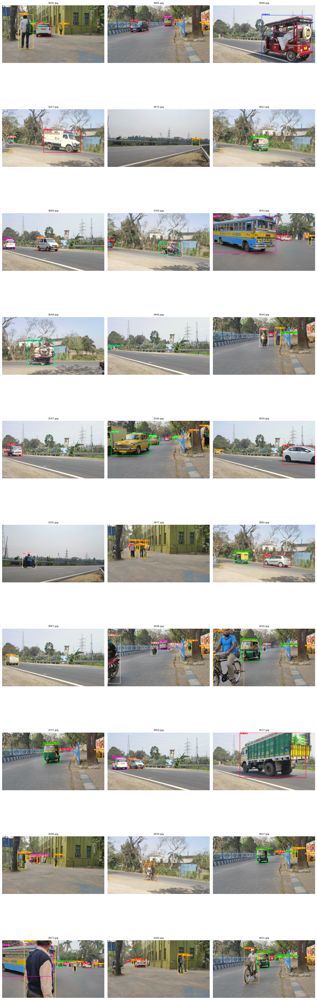

In [9]:
import os
import random
import cv2
import numpy as np
import torch
from IPython.display import display
import matplotlib.pyplot as plt
from pathlib import Path
from yolov5 import detect  # Import detect.py as a module

def display_random_images_from_folder(folder_path, num_images=30):
    """
    Finds and displays a random selection of .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List all valid images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Randomly select images (up to num_images)
    num_images = min(num_images, len(image_files))  # In case there are fewer than 30 images
    selected_images = random.sample(image_files, num_images)

    # Grid setup
    grid_rows = 10  # Adjust based on num_images
    grid_cols = 3
    plt.figure(figsize=(15, 5*grid_rows))  # Adjust figure size

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_XYZ2RGB)
        
        plt.subplot(grid_rows, grid_cols, i + 1)
        plt.imshow(image_rgb)
        plt.title(image_file, fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
display_random_images_from_folder("/kaggle/working/yolov5/runs/detect/exp")